# Descenso de gradiente con momento

## Definicion de funciones y sus gradientes analiticos

In [1]:
import numpy as np
import matplotlib.pyplot as plt

# 1. Función de Rosenbrock y su gradiente
def rosenbrock(x, y):
    return (1 - x)**2 + 100 * (y - x**2)**2

def grad_rosenbrock(x, y):
    df_dx = -2 * (1 - x) - 400 * x * (y - x**2)
    df_dy = 200 * (y - x**2)
    return np.array([df_dx, df_dy])

# 2. Función de Himmelblau y su gradiente
def himmelblau(x, y):
    return (x**2 + y - 11)**2 + (x + y**2 - 7)**2

def grad_himmelblau(x, y):
    df_dx = 4 * (x**2 + y - 11) * x + 2 * (x + y**2 - 7)
    df_dy = 2 * (x**2 + y - 11) + 4 * (x + y**2 - 7) * y
    return np.array([df_dx, df_dy])

# 3. Función de McCormick y su gradiente
def mccormick(x, y):
    return np.sin(x + y) + (x - y)**2 - 1.5 * x + 2.5 * y + 1

def grad_mccormick(x, y):
    df_dx = np.cos(x + y) + 2 * (x - y) - 1.5
    df_dy = np.cos(x + y) - 2 * (x - y) + 2.5
    return np.array([df_dx, df_dy])

## RosenBrock

Valores finales SGD1:
x = -0.02585430794363525, y = -7.798670118128448
f(x,y) = 6084.020579664569
Valores finales SGD2:
x = 0.00015226845427875784, y = -32.49080028241989
f(x,y) = 105566.21014536021
Valores finales mom1:
x = -6.005336275359297, y = 37.28325936574174
f(x,y) = 197.71852392441338
Valores finales mom2:
x = 0.18955836275677046, y = -1.2637142314950738
f(x,y) = 169.56494527660982


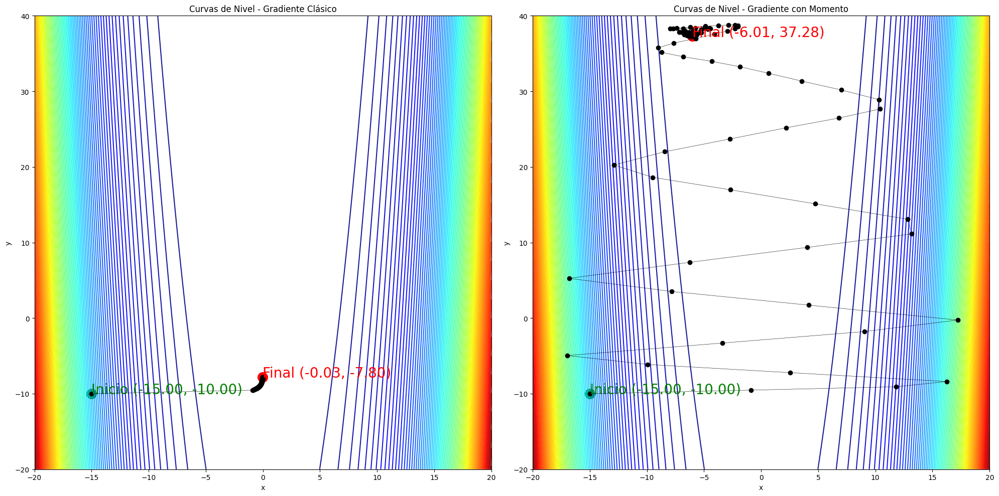

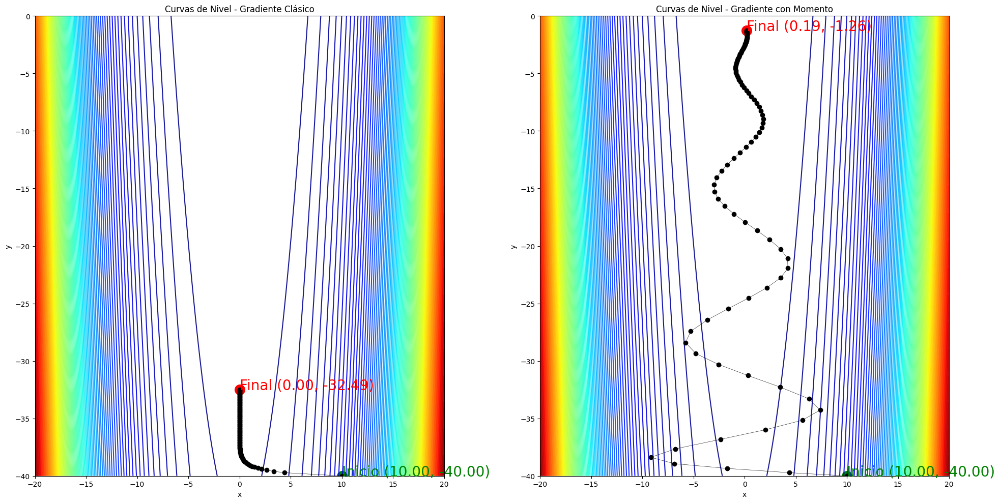

In [2]:
# Parámetros
lr = 1e-5
max_iter = 100
mu = 0.9

# Inicialización
x_1, y_1 = -15, -10  # Punto de inicio
path_gd = [(x_1, y_1)]  # Lista para guardar el camino seguido

x_2, y_2 = 10, -40  # Punto de inicio
path_gd2 = [(x_2, y_2)]  # Lista para guardar el camino seguido

# Descenso de Gradiente Clásico
for _ in range(max_iter):
    grad = grad_rosenbrock(x_1, y_1)
    x_1 -= lr * grad[0]
    y_1 -= lr * grad[1]
    path_gd.append((x_1, y_1))

print('Valores finales SGD1:\nx = {}, y = {}\nf(x,y) = {}'.format(x_1,y_1,rosenbrock(x_1,y_1)))
path_gd = np.array(path_gd)

for _ in range(max_iter):
    grad = grad_rosenbrock(x_2, y_2)
    x_2 -= lr * grad[0]
    y_2 -= lr * grad[1]
    path_gd2.append((x_2, y_2))

print('Valores finales SGD2:\nx = {}, y = {}\nf(x,y) = {}'.format(x_2,y_2,rosenbrock(x_2,y_2)))
path_gd2 = np.array(path_gd2)

#############################################333

x_3, y_3 = -15, -10
momentum = np.array([0.0, 0.0])
path_momentum = [(x_3, y_3)]

x_4, y_4 = 10, -40
momentum2 = np.array([0.0, 0.0])
path_momentum2 = [(x_4, y_4)]

# Descenso de Gradiente con Momento
for _ in range(max_iter):
    grad = grad_rosenbrock(x_3, y_3)
    momentum = mu * momentum - lr * grad  # Actualizar la velocidad
    x_3 += momentum[0]
    y_3 += momentum[1]
    path_momentum.append((x_3, y_3))
print('Valores finales mom1:\nx = {}, y = {}\nf(x,y) = {}'.format(x_3, y_3,rosenbrock(x_3, y_3)))
path_momentum = np.array(path_momentum)

for _ in range(max_iter):
    grad = grad_rosenbrock(x_4, y_4)
    momentum2 = mu * momentum2 - lr * grad  # Actualizar la velocidad
    x_4 += momentum2[0]
    y_4 += momentum2[1]
    path_momentum2.append((x_4, y_4))
print('Valores finales mom2:\nx = {}, y = {}\nf(x,y) = {}'.format(x_4, y_4,rosenbrock(x_4, y_4)))
path_momentum2 = np.array(path_momentum2)


fig, axes = plt.subplots(1, 2, figsize=(20, 10))
x = np.linspace(-20, 20, 500)
y = np.linspace(-20, 40, 500)
X, Y = np.meshgrid(x, y)
Z=rosenbrock(X,Y)
# Gráfico 1: Curvas de nivel y trayectoria de descenso de gradiente clásico
axes[0].contour(X, Y, Z, levels=100, cmap='jet', alpha=.9)  # Dibujar las curvas de nivel
axes[0].set_title('Curvas de Nivel - Gradiente Clásico')
axes[0].plot(path_gd[:, 0], path_gd[:, 1], 'o-', color='k', linewidth=0.4)  # Trayectoria
axes[0].scatter(path_gd[0][0], path_gd[0][1], c='green', s=200)# Punto inicial
axes[0].scatter(path_gd[-1][0], path_gd[-1][1], c='red', s=200)  # Punto final
axes[0].text(path_gd[0][0], path_gd[0][1], f'Inicio ({path_gd[0][0]:.2f}, {path_gd[0][1]:.2f})', fontsize=20, color='green')
axes[0].text(path_gd[-1][0], path_gd[-1][1], f'Final ({path_gd[-1][0]:.2f}, {path_gd[-1][1]:.2f})', fontsize=20, color='red')
axes[0].set_xlabel('x')
axes[0].set_ylabel('y')
# Gráfico 2: Curvas de nivel y trayectoria de descenso de gradiente con momento
axes[1].contour(X, Y, Z, levels=100, cmap='jet', alpha=.9)  # Dibujar las curvas de nivel
axes[1].set_title('Curvas de Nivel - Gradiente con Momento')
axes[1].plot(path_momentum[:, 0], path_momentum[:, 1], 'o-', color='k', linewidth=0.4)  # Trayectoria
axes[1].scatter(path_momentum[0][0], path_momentum[0][1], c='green', s=200)  # Punto inicial
axes[1].scatter(path_momentum[-1][0], path_momentum[-1][1], c='red', s=200)  # Punto final
axes[1].text(path_momentum[0][0], path_momentum[0][1], f'Inicio ({path_momentum[0][0]:.2f}, {path_momentum[0][1]:.2f})', fontsize=20, color='green')
axes[1].text(path_momentum[-1][0], path_momentum[-1][1], f'Final ({path_momentum[-1][0]:.2f}, {path_momentum[-1][1]:.2f})', fontsize=20, color='red')
axes[1].set_xlabel('x')
axes[1].set_ylabel('y')
plt.tight_layout()
plt.show()


fig, axes = plt.subplots(1, 2, figsize=(20, 10))
x = np.linspace(-20, 20, 500)
y = np.linspace(-40, 0, 500)
X, Y = np.meshgrid(x, y)
Z=rosenbrock(X,Y)
# Gráfico 1: Curvas de nivel y trayectoria de descenso de gradiente clásico
axes[0].contour(X, Y, Z, levels=100, cmap='jet', alpha=.9)  # Dibujar las curvas de nivel
axes[0].set_title('Curvas de Nivel - Gradiente Clásico')
axes[0].plot(path_gd2[:, 0], path_gd2[:, 1], 'o-', color='k', linewidth=0.4)  # Trayectoria
axes[0].scatter(path_gd2[0][0], path_gd2[0][1], c='green', s=200)# Punto inicial
axes[0].scatter(path_gd2[-1][0], path_gd2[-1][1], c='red', s=200)  # Punto final
axes[0].text(path_gd2[0][0], path_gd2[0][1], f'Inicio ({path_gd2[0][0]:.2f}, {path_gd2[0][1]:.2f})', fontsize=20, color='green')
axes[0].text(path_gd2[-1][0], path_gd2[-1][1], f'Final ({path_gd2[-1][0]:.2f}, {path_gd2[-1][1]:.2f})', fontsize=20, color='red')
axes[0].set_xlabel('x')
axes[0].set_ylabel('y')
# Gráfico 2: Curvas de nivel y trayectoria de descenso de gradiente con momento
axes[1].contour(X, Y, Z, levels=100, cmap='jet', alpha=.9)  # Dibujar las curvas de nivel
axes[1].set_title('Curvas de Nivel - Gradiente con Momento')
axes[1].plot(path_momentum2[:, 0], path_momentum2[:, 1], 'o-', color='k', linewidth=0.4)  # Trayectoria
axes[1].scatter(path_momentum2[0][0], path_momentum2[0][1], c='green', s=200)  # Punto inicial
axes[1].scatter(path_momentum2[-1][0], path_momentum2[-1][1], c='red', s=200)  # Punto final
axes[1].text(path_momentum2[0][0], path_momentum2[0][1], f'Inicio ({path_momentum2[0][0]:.2f}, {path_momentum2[0][1]:.2f})', fontsize=20, color='green')
axes[1].text(path_momentum2[-1][0], path_momentum2[-1][1], f'Final ({path_momentum2[-1][0]:.2f}, {path_momentum2[-1][1]:.2f})', fontsize=20, color='red')
axes[1].set_xlabel('x')
axes[1].set_ylabel('y')
plt.tight_layout()
plt.show()

## himmelblau

Valores finales SGD1:
x = -11.150500020130833, y = -11.055147409021288
f(x,y) = 21290.57967952072
Valores finales SGD2:
x = 7.698780673592491, y = -10.675170870765236
f(x,y) = 14559.932500117742
Valores finales mom1:
x = 3.6247383915810647, y = 3.3187204081871773
f(x,y) = 88.1326226952486
Valores finales mom2:
x = 2.959551522876828, y = -0.9257024449614668
f(x,y) = 20.163172967269585


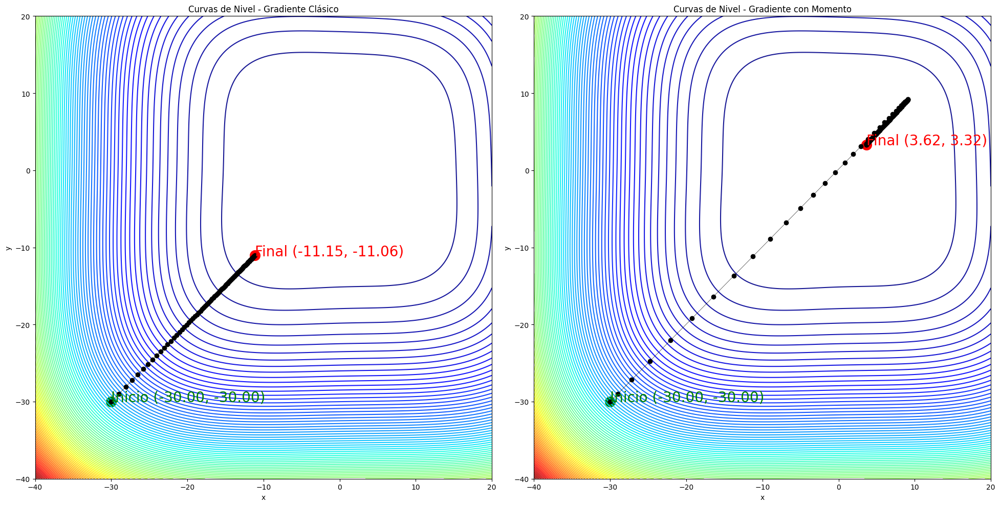

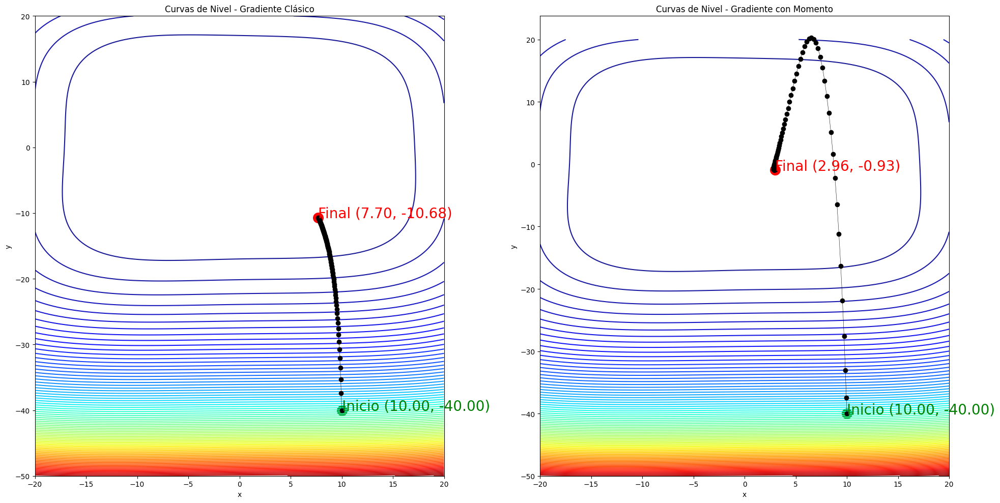

In [3]:
# Parámetros
lr = 1e-5
max_iter = 100
mu = 0.9

# Inicialización
x_1, y_1 = -30, -30  # Punto de inicio
path_gd = [(x_1, y_1)]  # Lista para guardar el camino seguido

x_2, y_2 = 10, -40  # Punto de inicio
path_gd2 = [(x_2, y_2)]  # Lista para guardar el camino seguido

# Descenso de Gradiente Clásico
for _ in range(max_iter):
    grad = grad_himmelblau(x_1, y_1)
    x_1 -= lr * grad[0]
    y_1 -= lr * grad[1]
    path_gd.append((x_1, y_1))

print('Valores finales SGD1:\nx = {}, y = {}\nf(x,y) = {}'.format(x_1,y_1,himmelblau(x_1,y_1)))
path_gd = np.array(path_gd)

for _ in range(max_iter):
    grad = grad_himmelblau(x_2, y_2)
    x_2 -= lr * grad[0]
    y_2 -= lr * grad[1]
    path_gd2.append((x_2, y_2))

print('Valores finales SGD2:\nx = {}, y = {}\nf(x,y) = {}'.format(x_2,y_2,himmelblau(x_2,y_2)))
path_gd2 = np.array(path_gd2)

#############################################333

x_3, y_3 = -30, -30
momentum = np.array([0.0, 0.0])
path_momentum = [(x_3, y_3)]

x_4, y_4 = 10, -40
momentum2 = np.array([0.0, 0.0])
path_momentum2 = [(x_4, y_4)]

# Descenso de Gradiente con Momento
for _ in range(max_iter):
    grad = grad_himmelblau(x_3, y_3)
    momentum = mu * momentum - lr * grad  # Actualizar la velocidad
    x_3 += momentum[0]
    y_3 += momentum[1]
    path_momentum.append((x_3, y_3))
print('Valores finales mom1:\nx = {}, y = {}\nf(x,y) = {}'.format(x_3, y_3,himmelblau(x_3, y_3)))
path_momentum = np.array(path_momentum)

for _ in range(max_iter):
    grad = grad_himmelblau(x_4, y_4)
    momentum2 = mu * momentum2 - lr * grad  # Actualizar la velocidad
    x_4 += momentum2[0]
    y_4 += momentum2[1]
    path_momentum2.append((x_4, y_4))
print('Valores finales mom2:\nx = {}, y = {}\nf(x,y) = {}'.format(x_4, y_4,himmelblau(x_4, y_4)))
path_momentum2 = np.array(path_momentum2)


fig, axes = plt.subplots(1, 2, figsize=(20, 10))
x = np.linspace(-40, 20, 500)
y = np.linspace(-40, 20, 500)
X, Y = np.meshgrid(x, y)
Z=himmelblau(X,Y)
# Gráfico 1: Curvas de nivel y trayectoria de descenso de gradiente clásico
axes[0].contour(X, Y, Z, levels=100, cmap='jet', alpha=.9)  # Dibujar las curvas de nivel
axes[0].set_title('Curvas de Nivel - Gradiente Clásico')
axes[0].plot(path_gd[:, 0], path_gd[:, 1], 'o-', color='k', linewidth=0.4)  # Trayectoria
axes[0].scatter(path_gd[0][0], path_gd[0][1], c='green', s=200)# Punto inicial
axes[0].scatter(path_gd[-1][0], path_gd[-1][1], c='red', s=200)  # Punto final
axes[0].text(path_gd[0][0], path_gd[0][1], f'Inicio ({path_gd[0][0]:.2f}, {path_gd[0][1]:.2f})', fontsize=20, color='green')
axes[0].text(path_gd[-1][0], path_gd[-1][1], f'Final ({path_gd[-1][0]:.2f}, {path_gd[-1][1]:.2f})', fontsize=20, color='red')
axes[0].set_xlabel('x')
axes[0].set_ylabel('y')
# Gráfico 2: Curvas de nivel y trayectoria de descenso de gradiente con momento
axes[1].contour(X, Y, Z, levels=100, cmap='jet', alpha=.9)  # Dibujar las curvas de nivel
axes[1].set_title('Curvas de Nivel - Gradiente con Momento')
axes[1].plot(path_momentum[:, 0], path_momentum[:, 1], 'o-', color='k', linewidth=0.4)  # Trayectoria
axes[1].scatter(path_momentum[0][0], path_momentum[0][1], c='green', s=200)  # Punto inicial
axes[1].scatter(path_momentum[-1][0], path_momentum[-1][1], c='red', s=200)  # Punto final
axes[1].text(path_momentum[0][0], path_momentum[0][1], f'Inicio ({path_momentum[0][0]:.2f}, {path_momentum[0][1]:.2f})', fontsize=20, color='green')
axes[1].text(path_momentum[-1][0], path_momentum[-1][1], f'Final ({path_momentum[-1][0]:.2f}, {path_momentum[-1][1]:.2f})', fontsize=20, color='red')
axes[1].set_xlabel('x')
axes[1].set_ylabel('y')
plt.tight_layout()
plt.show()


fig, axes = plt.subplots(1, 2, figsize=(20, 10))
x = np.linspace(-20, 20, 500)
y = np.linspace(-50, 20, 500)
X, Y = np.meshgrid(x, y)
Z=himmelblau(X,Y)
# Gráfico 1: Curvas de nivel y trayectoria de descenso de gradiente clásico
axes[0].contour(X, Y, Z, levels=100, cmap='jet', alpha=.9)  # Dibujar las curvas de nivel
axes[0].set_title('Curvas de Nivel - Gradiente Clásico')
axes[0].plot(path_gd2[:, 0], path_gd2[:, 1], 'o-', color='k', linewidth=0.4)  # Trayectoria
axes[0].scatter(path_gd2[0][0], path_gd2[0][1], c='green', s=200)# Punto inicial
axes[0].scatter(path_gd2[-1][0], path_gd2[-1][1], c='red', s=200)  # Punto final
axes[0].text(path_gd2[0][0], path_gd2[0][1], f'Inicio ({path_gd2[0][0]:.2f}, {path_gd2[0][1]:.2f})', fontsize=20, color='green')
axes[0].text(path_gd2[-1][0], path_gd2[-1][1], f'Final ({path_gd2[-1][0]:.2f}, {path_gd2[-1][1]:.2f})', fontsize=20, color='red')
axes[0].set_xlabel('x')
axes[0].set_ylabel('y')
# Gráfico 2: Curvas de nivel y trayectoria de descenso de gradiente con momento
axes[1].contour(X, Y, Z, levels=100, cmap='jet', alpha=.9)  # Dibujar las curvas de nivel
axes[1].set_title('Curvas de Nivel - Gradiente con Momento')
axes[1].plot(path_momentum2[:, 0], path_momentum2[:, 1], 'o-', color='k', linewidth=0.4)  # Trayectoria
axes[1].scatter(path_momentum2[0][0], path_momentum2[0][1], c='green', s=200)  # Punto inicial
axes[1].scatter(path_momentum2[-1][0], path_momentum2[-1][1], c='red', s=200)  # Punto final
axes[1].text(path_momentum2[0][0], path_momentum2[0][1], f'Inicio ({path_momentum2[0][0]:.2f}, {path_momentum2[0][1]:.2f})', fontsize=20, color='green')
axes[1].text(path_momentum2[-1][0], path_momentum2[-1][1], f'Final ({path_momentum2[-1][0]:.2f}, {path_momentum2[-1][1]:.2f})', fontsize=20, color='red')
axes[1].set_xlabel('x')
axes[1].set_ylabel('y')
plt.tight_layout()
plt.show()

## McCormick

Valores finales SGD1:
x = -14.15896244139054, y = -11.140267013754649
f(x,y) = 3.334578050110565
Valores finales SGD2:
x = 23.461524416491088, y = -3.659995863142106
f(x,y) = 693.049147363962
Valores finales mom1:
x = -12.929014804399612, y = -13.978640543216708
f(x,y) = -14.430605151910207
Valores finales mom2:
x = 9.190255644950506, y = 8.512822947261643
f(x,y) = 8.044269647451461


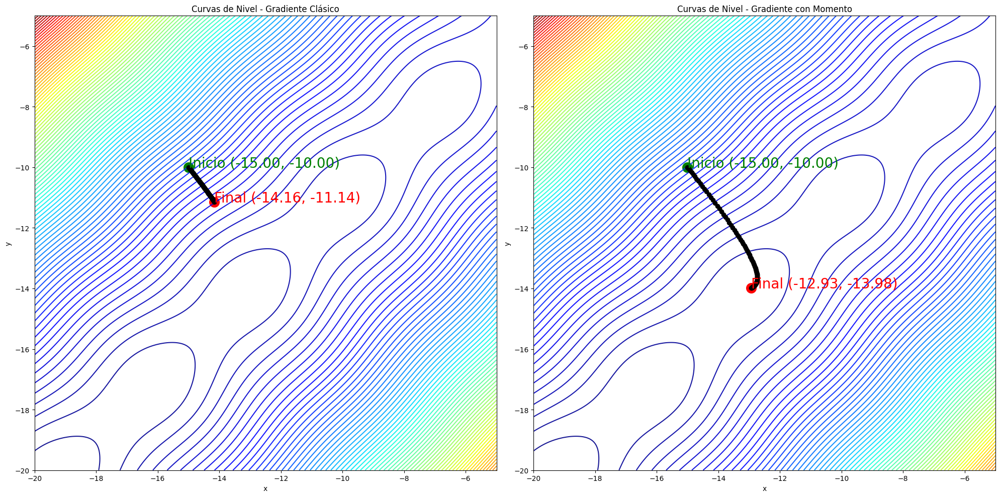

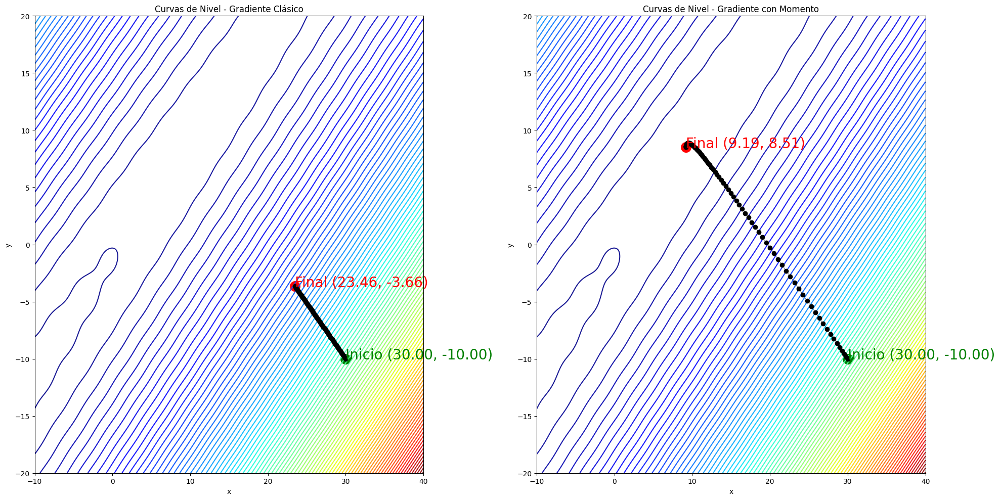

In [4]:
# Parámetros
lr = 1e-3
max_iter = 100
mu = 0.9

# Inicialización
x_1, y_1 = -15, -10  # Punto de inicio
path_gd = [(x_1, y_1)]  # Lista para guardar el camino seguido

x_2, y_2 = 30, -10  # Punto de inicio
path_gd2 = [(x_2, y_2)]  # Lista para guardar el camino seguido

# Descenso de Gradiente Clásico
for _ in range(max_iter):
    grad = grad_mccormick(x_1, y_1)
    x_1 -= lr * grad[0]
    y_1 -= lr * grad[1]
    path_gd.append((x_1, y_1))

print('Valores finales SGD1:\nx = {}, y = {}\nf(x,y) = {}'.format(x_1,y_1,mccormick(x_1,y_1)))
path_gd = np.array(path_gd)

for _ in range(max_iter):
    grad = grad_mccormick(x_2, y_2)
    x_2 -= lr * grad[0]
    y_2 -= lr * grad[1]
    path_gd2.append((x_2, y_2))

print('Valores finales SGD2:\nx = {}, y = {}\nf(x,y) = {}'.format(x_2,y_2,mccormick(x_2,y_2)))
path_gd2 = np.array(path_gd2)

#############################################333

x_3, y_3 = -15, -10
momentum = np.array([0.0, 0.0])
path_momentum = [(x_3, y_3)]

x_4, y_4 = 30, -10
momentum2 = np.array([0.0, 0.0])
path_momentum2 = [(x_4, y_4)]

# Descenso de Gradiente con Momento
for _ in range(max_iter):
    grad = grad_mccormick(x_3, y_3)
    momentum = mu * momentum - lr * grad  # Actualizar la velocidad
    x_3 += momentum[0]
    y_3 += momentum[1]
    path_momentum.append((x_3, y_3))
print('Valores finales mom1:\nx = {}, y = {}\nf(x,y) = {}'.format(x_3, y_3,mccormick(x_3, y_3)))
path_momentum = np.array(path_momentum)

for _ in range(max_iter):
    grad = grad_mccormick(x_4, y_4)
    momentum2 = mu * momentum2 - lr * grad  # Actualizar la velocidad
    x_4 += momentum2[0]
    y_4 += momentum2[1]
    path_momentum2.append((x_4, y_4))
print('Valores finales mom2:\nx = {}, y = {}\nf(x,y) = {}'.format(x_4, y_4,mccormick(x_4, y_4)))
path_momentum2 = np.array(path_momentum2)



fig, axes = plt.subplots(1, 2, figsize=(20, 10))
x = np.linspace(-20, -5, 500)
y = np.linspace(-20, -5, 500)
X, Y = np.meshgrid(x, y)
Z=mccormick(X,Y)
# Gráfico 1: Curvas de nivel y trayectoria de descenso de gradiente clásico
axes[0].contour(X, Y, Z, levels=100, cmap='jet', alpha=.9)  # Dibujar las curvas de nivel
axes[0].set_title('Curvas de Nivel - Gradiente Clásico')
axes[0].plot(path_gd[:, 0], path_gd[:, 1], 'o-', color='k', linewidth=0.4)  # Trayectoria
axes[0].scatter(path_gd[0][0], path_gd[0][1], c='green', s=200)# Punto inicial
axes[0].scatter(path_gd[-1][0], path_gd[-1][1], c='red', s=200)  # Punto final
axes[0].text(path_gd[0][0], path_gd[0][1], f'Inicio ({path_gd[0][0]:.2f}, {path_gd[0][1]:.2f})', fontsize=20, color='green')
axes[0].text(path_gd[-1][0], path_gd[-1][1], f'Final ({path_gd[-1][0]:.2f}, {path_gd[-1][1]:.2f})', fontsize=20, color='red')
axes[0].set_xlabel('x')
axes[0].set_ylabel('y')
# Gráfico 2: Curvas de nivel y trayectoria de descenso de gradiente con momento
axes[1].contour(X, Y, Z, levels=100, cmap='jet', alpha=.9)  # Dibujar las curvas de nivel
axes[1].set_title('Curvas de Nivel - Gradiente con Momento')
axes[1].plot(path_momentum[:, 0], path_momentum[:, 1], 'o-', color='k', linewidth=0.4)  # Trayectoria
axes[1].scatter(path_momentum[0][0], path_momentum[0][1], c='green', s=200)  # Punto inicial
axes[1].scatter(path_momentum[-1][0], path_momentum[-1][1], c='red', s=200)  # Punto final
axes[1].text(path_momentum[0][0], path_momentum[0][1], f'Inicio ({path_momentum[0][0]:.2f}, {path_momentum[0][1]:.2f})', fontsize=20, color='green')
axes[1].text(path_momentum[-1][0], path_momentum[-1][1], f'Final ({path_momentum[-1][0]:.2f}, {path_momentum[-1][1]:.2f})', fontsize=20, color='red')
axes[1].set_xlabel('x')
axes[1].set_ylabel('y')
plt.tight_layout()
plt.show()


fig, axes = plt.subplots(1, 2, figsize=(20, 10))
x = np.linspace(-10, 40, 500)
y = np.linspace(-20, 20, 500)
X, Y = np.meshgrid(x, y)
Z=mccormick(X,Y)
# Gráfico 1: Curvas de nivel y trayectoria de descenso de gradiente clásico
axes[0].contour(X, Y, Z, levels=100, cmap='jet', alpha=.9)  # Dibujar las curvas de nivel
axes[0].set_title('Curvas de Nivel - Gradiente Clásico')
axes[0].plot(path_gd2[:, 0], path_gd2[:, 1], 'o-', color='k', linewidth=0.4)  # Trayectoria
axes[0].scatter(path_gd2[0][0], path_gd2[0][1], c='green', s=200)# Punto inicial
axes[0].scatter(path_gd2[-1][0], path_gd2[-1][1], c='red', s=200)  # Punto final
axes[0].text(path_gd2[0][0], path_gd2[0][1], f'Inicio ({path_gd2[0][0]:.2f}, {path_gd2[0][1]:.2f})', fontsize=20, color='green')
axes[0].text(path_gd2[-1][0], path_gd2[-1][1], f'Final ({path_gd2[-1][0]:.2f}, {path_gd2[-1][1]:.2f})', fontsize=20, color='red')
axes[0].set_xlabel('x')
axes[0].set_ylabel('y')
# Gráfico 2: Curvas de nivel y trayectoria de descenso de gradiente con momento
axes[1].contour(X, Y, Z, levels=100, cmap='jet', alpha=.9)  # Dibujar las curvas de nivel
axes[1].set_title('Curvas de Nivel - Gradiente con Momento')
axes[1].plot(path_momentum2[:, 0], path_momentum2[:, 1], 'o-', color='k', linewidth=0.4)  # Trayectoria
axes[1].scatter(path_momentum2[0][0], path_momentum2[0][1], c='green', s=200)  # Punto inicial
axes[1].scatter(path_momentum2[-1][0], path_momentum2[-1][1], c='red', s=200)  # Punto final
axes[1].text(path_momentum2[0][0], path_momentum2[0][1], f'Inicio ({path_momentum2[0][0]:.2f}, {path_momentum2[0][1]:.2f})', fontsize=20, color='green')
axes[1].text(path_momentum2[-1][0], path_momentum2[-1][1], f'Final ({path_momentum2[-1][0]:.2f}, {path_momentum2[-1][1]:.2f})', fontsize=20, color='red')
axes[1].set_xlabel('x')
axes[1].set_ylabel('y')
plt.tight_layout()
plt.show()

## Explorar una imagen y su máscara del conjunto de datos

In [5]:
pip install git+https://github.com/gautamchitnis/cocoapi.git@cocodataset-master#subdirectory=PythonAPI

  Cloning https://github.com/gautamchitnis/cocoapi.git (to revision cocodataset-master) to /tmp/pip-req-build-tzc80l1g
  Running command git clone --filter=blob:none --quiet https://github.com/gautamchitnis/cocoapi.git /tmp/pip-req-build-tzc80l1g
  Running command git checkout -b cocodataset-master --track origin/cocodataset-master
  Switched to a new branch 'cocodataset-master'
  Branch 'cocodataset-master' set up to track remote branch 'cocodataset-master' from 'origin'.
  Resolved https://github.com/gautamchitnis/cocoapi.git to commit 20291f19c46a8d11935862bc9e449a1b72ec25ed
  Preparing metadata (setup.py) ... done
  Created wheel for pycocotools: filename=pycocotools-2.0-cp310-cp310-linux_x86_64.whl size=376077 sha256=accc5c83c199e8a8fd341263dba82f626e355ed0005f6c1a21efd5c073e2036f
  Stored in directory: /tmp/pip-ephem-wheel-cache-ylfo98eq/wheels/83/c2/a9/31695b4858fd20696ebf8ae959a4e447159f8bf667a4c105f3
Successfully built pycocotools
  Attempting uninstall: pycocotools
    Found 

In [6]:
import os
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


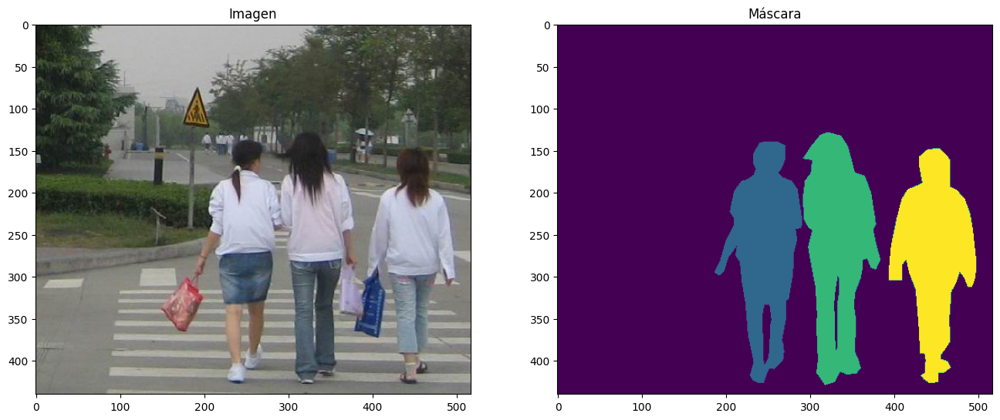

In [7]:
import matplotlib.pyplot as plt
from torchvision.io import read_image

# Directorio para las imágenes del conjunto de datos en drive
data_dir = "/content/drive/MyDrive/Colab Notebooks/"

image = read_image(data_dir + "PennFudanPed/PNGImages/FudanPed00060.png")
mask = read_image(data_dir + "PennFudanPed/PedMasks/FudanPed00060_mask.png")

plt.figure(figsize=(16, 8))
plt.subplot(121)
plt.title("Imagen")
plt.imshow(image.permute(1, 2, 0))
plt.subplot(122)
plt.title("Máscara")
plt.imshow(mask.permute(1, 2, 0))

## Crear clase especial para cargar las imágenes, sus máscaras y sus transformadas para el preprocesamiento

In [8]:
import os
import torch

from torchvision.io import read_image
from torchvision.ops.boxes import masks_to_boxes
from torchvision import tv_tensors
from torchvision.transforms.v2 import functional as F


class PennFudanDataset(torch.utils.data.Dataset):
    def __init__(self, root, transforms):
        self.root = root
        self.transforms = transforms
        # cargar los nombres de imágenes y sus máscaras
        self.imgs = list(sorted(os.listdir(os.path.join(root, "PNGImages"))))
        self.masks = list(sorted(os.listdir(os.path.join(root, "PedMasks"))))

    def __getitem__(self, idx):
        # leer imágenes y máscaras a partir de las listas de nombres
        img_path  = os.path.join(self.root, "PNGImages", self.imgs[idx])
        mask_path = os.path.join(self.root, "PedMasks", self.masks[idx])
        img       = read_image(img_path)
        mask      = read_image(mask_path)
        # codificar cada instancia de peaton con un color diferente
        obj_ids = torch.unique(mask)
        # eliminar el id de fondo (primera instancia)
        obj_ids   = obj_ids[1:]
        num_objs = len(obj_ids)

        # obtener máscaras binarias por separado
        masks = (mask == obj_ids[:, None, None]).to(dtype=torch.uint8)

        # llamar función para obtener cajas que rodean a cada peatón
        boxes = masks_to_boxes(masks)

        # etiqueta para clase peatón
        labels = torch.ones((num_objs,), dtype=torch.int64)

        image_id = idx
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        # suponer que conjuntos de peatones son úno solo
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)

        # Cargar en tensores tv_tensors y formato apropiado para las cajas y los potrs.
        img = tv_tensors.Image(img)

        target = {}
        target["boxes"] = tv_tensors.BoundingBoxes(boxes, format="XYXY", canvas_size=F.get_size(img))
        target["masks"] = tv_tensors.Mask(masks)
        target["labels"] = labels
        target["image_id"] = image_id
        target["area"] = area
        target["iscrowd"] = iscrowd

        if self.transforms is not None:
            img, target = self.transforms(img, target)

        return img, target

    def __len__(self):
        return len(self.imgs)

## Cargar modelo multi-tarea ([Mask-RCNN](https://arxiv.org/abs/1703.06870)) para segmentación y detección de objetos
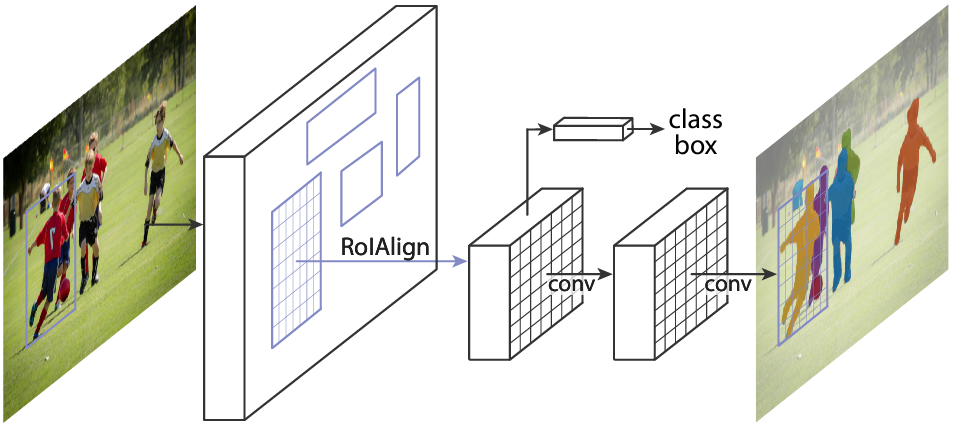

In [9]:
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor

# Obtener instancia del modelo adaptado para dos clases y sus respectivas máscaras
def modelo_segmentacion(  numero_clases  ):
    # cargar instancia del modelo Mask-RCNN pre-entrenado en COCO
    modelo = torchvision.models.detection.maskrcnn_resnet50_fpn(weights="DEFAULT")

    # obtener caracteristicas del módulo de capas de predicción para
    # las cajas de los objetos y usarlas como entrada para una nueva
    # capa que predecirá las coordenadas de la caja de cada objeto
    caracteristicas_caja = modelo.roi_heads.box_predictor.cls_score.in_features
    modelo.roi_heads.box_predictor = FastRCNNPredictor( caracteristicas_caja , numero_clases)

    # cambiar el predictor de las máscaras de segmentación usando caracteristicas
    # de una capa convolucional del modelo
    caracteristicas_conv_masc = modelo.roi_heads.mask_predictor.conv5_mask.in_channels
    n_capa_escondida = 256
    modelo.roi_heads.mask_predictor = MaskRCNNPredictor( caracteristicas_conv_masc,n_capa_escondida, numero_clases)

    return modelo

## Cargar funciones auxiliares para la evaluación y el entrenamiento

In [10]:
import os

# Crear la carpeta 'coconew' si no existe
os.makedirs('coconew', exist_ok=True)

# Descargar los archivos
os.system("wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/engine.py -P coconew")
os.system("wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/utils.py -P coconew")
os.system("wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/coco_utils.py -P coconew")
os.system("wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/coco_eval.py -P coconew")
os.system("wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/transforms.py -P coconew")


!sed -n '378,379p' /usr/local/lib/python3.10/dist-packages/pycocotools/cocoeval.py
!sed -i '378c\                    tp_sum = np.cumsum(tps, axis=1).astype(dtype=np.float64)' /usr/local/lib/python3.10/dist-packages/pycocotools/cocoeval.py

!sed -i '379c\                    fp_sum = np.cumsum(fps, axis=1).astype(dtype=np.float64)' /usr/local/lib/python3.10/dist-packages/pycocotools/cocoeval.py
!sed -n '378,379p' /usr/local/lib/python3.10/dist-packages/pycocotools/cocoeval.py

!sed -n '7,9p' /content/coconew/engine.py
!sed -i '7c\from coconew import utils' /content/coconew/engine.py
!sed -i '8c\from coconew.coco_eval import CocoEvaluator' /content/coconew/engine.py
!sed -i '9c\from coconew.coco_utils import get_coco_api_from_dataset' /content/coconew/engine.py

!sed -n '8p' /content/coconew/coco_eval.py
!sed -i '8c\from coconew import utils' /content/coconew/coco_eval.py

!sed -n '6p' /content/coconew/coco_utils.py
!sed -i '6c\from coconew import transforms as T' /content/coconew/coco_utils.py


                    tp_sum = np.cumsum(tps, axis=1).astype(dtype=np.float)
                    fp_sum = np.cumsum(fps, axis=1).astype(dtype=np.float)
                    tp_sum = np.cumsum(tps, axis=1).astype(dtype=np.float64)
                    fp_sum = np.cumsum(fps, axis=1).astype(dtype=np.float64)
import utils
from coco_eval import CocoEvaluator
from coco_utils import get_coco_api_from_dataset
import utils
import transforms as T


## Cargar funciones auxiliares para transformadas que aumentarán los datos o para preprocesamiento

In [11]:
from torchvision.transforms import v2 as T


def obtener_transformada(entrenamiento):
    transformadas = []
    if entrenamiento:
        transformadas.append(T.RandomHorizontalFlip(0.5))
    transformadas.append(T.ToDtype(torch.float, scale=True))
    transformadas.append(T.ToPureTensor())
    return T.Compose(transformadas)

## Terminar de realizar la carga de los datos y su preprocesamiento

In [12]:
from coconew import utils

# cargar los datos de entrenamiento y prueba con la función auxiliar definida
conjunto_datos         = PennFudanDataset( data_dir + 'PennFudanPed', obtener_transformada(entrenamiento=True))
conjunto_datos_prueba = PennFudanDataset( data_dir + 'PennFudanPed', obtener_transformada(entrenamiento=False))

# partir datos en conjuntos de entrenamiento y prueba
indices = torch.randperm(len(conjunto_datos)).tolist()
conjunto_datos        = torch.utils.data.Subset(conjunto_datos, indices[:-50])
conjunto_datos_prueba = torch.utils.data.Subset(conjunto_datos_prueba, indices[-50:])

# cargadores para ambos conjuntos
cargador_datos        = torch.utils.data.DataLoader( conjunto_datos, batch_size=2, shuffle=True, collate_fn=utils.collate_fn)
cargador_datos_prueba = torch.utils.data.DataLoader( conjunto_datos_prueba,batch_size=1,shuffle=False,collate_fn=utils.collate_fn )


## Calculo de coeficiente Dice durante entrenamiento

In [13]:
# Definir la función para calcular el coeficiente Dice
def dice_coefficient(pred_mask, true_mask, threshold=0.5):
    # Binarizar las predicciones y los targets
    pred_mask = (pred_mask > threshold).float()
    true_mask = true_mask.float()

    # Calcular la intersección y la unión
    intersection = torch.sum(pred_mask * true_mask)
    union = torch.sum(pred_mask) + torch.sum(true_mask)

    # Calcular el coeficiente Dice
    dice = (2.0 * intersection + 1e-6) / (union + 1e-6)
    return dice

In [14]:
from tqdm import tqdm
def train_one_epoch_with_dice(model, data_loader, device, optimizer, print_freq, epoch, scaler=None):
    model.train()
    metric_logger = utils.MetricLogger(delimiter="  ")
    metric_logger.add_meter("lr", utils.SmoothedValue(window_size=1, fmt="{value:.6f}"))
    header = f"Training Epoch {epoch}:"
    model.to(device)

    with tqdm(data_loader, desc=header) as tq:
        lr_scheduler = None
        dice_scores = []
        loss_values = []  # Almacenar todos los coeficientes Dice de la época
        for i, (images, targets) in enumerate(tq):
            images = [img.to(device) for img in images]
            targets = [{k: (v.to(device) if isinstance(v, torch.Tensor) else v) for k, v in t.items()} for t in targets]


            with torch.amp.autocast("cuda",enabled=scaler is not None):
                loss_dict = model(images, targets)
                losses = sum(loss for loss in loss_dict.values())

            loss_value = losses.item()
            loss_values.append(loss_value)
            optimizer.zero_grad()

            if scaler is not None:
                scaler.scale(losses).backward()
                scaler.step(optimizer)
                scaler.update()
            else:
                losses.backward()
                optimizer.step()

            if lr_scheduler is not None:
                lr_scheduler.step()

            # Evaluar el coeficiente Dice
            model.eval()  # Cambiar a modo de evaluación para hacer predicciones
            with torch.no_grad():
                predictions = model(images)

            # Calcular el coeficiente Dice para cada predicción y target
            for pred, target in zip(predictions, targets):
                pred_masks = pred["masks"].squeeze(1)  # Eliminar la dimensión del canal
                true_masks = target["masks"].squeeze(1)

                for pred_mask, true_mask in zip(pred_masks, true_masks):
                    dice = dice_coefficient(pred_mask, true_mask)
                    dice_scores.append(dice.item())

            model.train()  # Volver a modo de entrenamiento

            # Actualizar el promedio del coeficiente Dice en el progreso
            avg_dice = sum(dice_scores) / len(dice_scores) if dice_scores else 0.0
            tq.set_postfix(loss=loss_value, dice=avg_dice, lr=optimizer.param_groups[0]["lr"])

    # Imprimir el promedio del coeficiente Dice para la época
    print(f"Promedio de coeficiente Dice Score para la Epoca {epoch}: {sum(dice_scores) / len(dice_scores):.4f}")
    return loss_values, dice_scores

In [15]:
from coconew.engine import evaluate
losses_per_epoch = []
dice_per_epoch = []
# entrenar seleccionando el dispositivo (GPU en caso disponible)
if torch.cuda.is_available() :
   print("Usando GPU")
   dispositivo = torch.device('cuda')
else:
   print("Usando CPU")
   dispositivo = torch.device('cpu')

# obtener instancia del modelo segmentador
numero_clases = 2
modelo        = modelo_segmentacion(numero_clases)
# enviar modelo al dispositivo seleccionado
modelo.to(dispositivo)

# definir optimizador
params      = [p for p in modelo.parameters() if p.requires_grad]
#optimizador = torch.optim.SGD( params,lr=0.005,momentum=0.9,weight_decay=0.0005 )
optimizador = torch.optim.SGD( params,lr=0.002,momentum=0.9,weight_decay=0.0005 )

# definir un planificador para el decaimiento de la tasa de aprendizaje
lr_planif   = torch.optim.lr_scheduler.StepLR( optimizador,step_size=3,gamma=0.1 )

# usar pocas épocas para el entrenamiento
n_epocas    = 20
for epoca in range(n_epocas):
    # entrenar en conjunto de entrenamiento
    loss_values,dice_scores = train_one_epoch_with_dice(modelo,cargador_datos,dispositivo,optimizador,print_freq=10,epoch=epoca,scaler=None)
    # actualizar tasa de aprendizaje
    lr_planif.step()
    # Calcular el promedio de pérdidas y coeficiente Dice para la época actual
    avg_loss = sum(loss_values) / len(loss_values)
    avg_dice = sum(dice_scores) / len(dice_scores)
    losses_per_epoch.append(avg_loss)
    dice_per_epoch.append(avg_dice)
    # evaluar en el conjunto de prueba
    evaluate(modelo, cargador_datos_prueba, device=dispositivo)

print("Entrenamiento finalizado")

Usando GPU


Downloading: "https://download.pytorch.org/models/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth" to /root/.cache/torch/hub/checkpoints/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth
100%|██████████| 170M/170M [00:02<00:00, 75.2MB/s]
Training Epoch 0:: 100%|██████████| 60/60 [01:58<00:00,  1.97s/it, dice=0.463, loss=0.181, lr=0.002]


Promedio de coeficiente Dice Score para la Epoca 0: 0.4625
creating index...
index created!
Test:  [ 0/50]  eta: 0:00:11  model_time: 0.1890 (0.1890)  evaluator_time: 0.0082 (0.0082)  time: 0.2385  data: 0.0404  max mem: 3298
Test:  [49/50]  eta: 0:00:00  model_time: 0.0968 (0.1102)  evaluator_time: 0.0051 (0.0099)  time: 0.1342  data: 0.0190  max mem: 3298
Test: Total time: 0:00:07 (0.1420 s / it)
Averaged stats: model_time: 0.0968 (0.1102)  evaluator_time: 0.0051 (0.0099)
Accumulating evaluation results...
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.02s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.726
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.987
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.895
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.327
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.688
 A

Training Epoch 1:: 100%|██████████| 60/60 [00:50<00:00,  1.18it/s, dice=0.494, loss=0.33, lr=0.002]


Promedio de coeficiente Dice Score para la Epoca 1: 0.4942
creating index...
index created!
Test:  [ 0/50]  eta: 0:00:18  model_time: 0.1882 (0.1882)  evaluator_time: 0.0037 (0.0037)  time: 0.3618  data: 0.1689  max mem: 3298
Test:  [49/50]  eta: 0:00:00  model_time: 0.0982 (0.1089)  evaluator_time: 0.0046 (0.0088)  time: 0.1297  data: 0.0188  max mem: 3298
Test: Total time: 0:00:07 (0.1454 s / it)
Averaged stats: model_time: 0.0982 (0.1089)  evaluator_time: 0.0046 (0.0088)
Accumulating evaluation results...
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.780
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.988
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.941
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.410
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.665
 A

Training Epoch 2:: 100%|██████████| 60/60 [00:49<00:00,  1.20it/s, dice=0.408, loss=0.255, lr=0.002]


Promedio de coeficiente Dice Score para la Epoca 2: 0.4077
creating index...
index created!
Test:  [ 0/50]  eta: 0:00:10  model_time: 0.1843 (0.1843)  evaluator_time: 0.0042 (0.0042)  time: 0.2067  data: 0.0174  max mem: 3319
Test:  [49/50]  eta: 0:00:00  model_time: 0.0982 (0.1055)  evaluator_time: 0.0044 (0.0061)  time: 0.1300  data: 0.0189  max mem: 3319
Test: Total time: 0:00:06 (0.1328 s / it)
Averaged stats: model_time: 0.0982 (0.1055)  evaluator_time: 0.0044 (0.0061)
Accumulating evaluation results...
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.02s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.775
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.990
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.954
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.349
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.710
 A

Training Epoch 3:: 100%|██████████| 60/60 [00:50<00:00,  1.19it/s, dice=0.48, loss=0.206, lr=0.0002]


Promedio de coeficiente Dice Score para la Epoca 3: 0.4796
creating index...
index created!
Test:  [ 0/50]  eta: 0:00:10  model_time: 0.1763 (0.1763)  evaluator_time: 0.0060 (0.0060)  time: 0.2058  data: 0.0227  max mem: 3319
Test:  [49/50]  eta: 0:00:00  model_time: 0.0959 (0.1058)  evaluator_time: 0.0040 (0.0065)  time: 0.1295  data: 0.0197  max mem: 3319
Test: Total time: 0:00:06 (0.1354 s / it)
Averaged stats: model_time: 0.0959 (0.1058)  evaluator_time: 0.0040 (0.0065)
Accumulating evaluation results...
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.813
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.990
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.947
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.349
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.739
 A

Training Epoch 4:: 100%|██████████| 60/60 [00:50<00:00,  1.19it/s, dice=0.521, loss=0.162, lr=0.0002]


Promedio de coeficiente Dice Score para la Epoca 4: 0.5209
creating index...
index created!
Test:  [ 0/50]  eta: 0:00:10  model_time: 0.1854 (0.1854)  evaluator_time: 0.0033 (0.0033)  time: 0.2058  data: 0.0163  max mem: 3319
Test:  [49/50]  eta: 0:00:00  model_time: 0.0984 (0.1063)  evaluator_time: 0.0059 (0.0072)  time: 0.1412  data: 0.0250  max mem: 3319
Test: Total time: 0:00:06 (0.1375 s / it)
Averaged stats: model_time: 0.0984 (0.1063)  evaluator_time: 0.0059 (0.0072)
Accumulating evaluation results...
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.02s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.827
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.991
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.954
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.349
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.761
 A

Training Epoch 5:: 100%|██████████| 60/60 [00:49<00:00,  1.20it/s, dice=0.501, loss=0.194, lr=0.0002]


Promedio de coeficiente Dice Score para la Epoca 5: 0.5015
creating index...
index created!
Test:  [ 0/50]  eta: 0:00:10  model_time: 0.1837 (0.1837)  evaluator_time: 0.0032 (0.0032)  time: 0.2062  data: 0.0186  max mem: 3319
Test:  [49/50]  eta: 0:00:00  model_time: 0.0959 (0.1046)  evaluator_time: 0.0035 (0.0056)  time: 0.1270  data: 0.0184  max mem: 3319
Test: Total time: 0:00:06 (0.1316 s / it)
Averaged stats: model_time: 0.0959 (0.1046)  evaluator_time: 0.0035 (0.0056)
Accumulating evaluation results...
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.822
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.991
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.955
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.352
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.767
 A

Training Epoch 6:: 100%|██████████| 60/60 [00:49<00:00,  1.20it/s, dice=0.515, loss=0.305, lr=2e-5]


Promedio de coeficiente Dice Score para la Epoca 6: 0.5149
creating index...
index created!
Test:  [ 0/50]  eta: 0:00:10  model_time: 0.1858 (0.1858)  evaluator_time: 0.0049 (0.0049)  time: 0.2096  data: 0.0180  max mem: 3422
Test:  [49/50]  eta: 0:00:00  model_time: 0.0972 (0.1068)  evaluator_time: 0.0045 (0.0076)  time: 0.1354  data: 0.0218  max mem: 3422
Test: Total time: 0:00:06 (0.1383 s / it)
Averaged stats: model_time: 0.0972 (0.1068)  evaluator_time: 0.0045 (0.0076)
Accumulating evaluation results...
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.823
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.991
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.955
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.368
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.761
 A

Training Epoch 7:: 100%|██████████| 60/60 [00:49<00:00,  1.20it/s, dice=0.553, loss=0.158, lr=2e-5]


Promedio de coeficiente Dice Score para la Epoca 7: 0.5531
creating index...
index created!
Test:  [ 0/50]  eta: 0:00:10  model_time: 0.1858 (0.1858)  evaluator_time: 0.0032 (0.0032)  time: 0.2092  data: 0.0194  max mem: 3422
Test:  [49/50]  eta: 0:00:00  model_time: 0.0972 (0.1049)  evaluator_time: 0.0035 (0.0055)  time: 0.1283  data: 0.0197  max mem: 3422
Test: Total time: 0:00:06 (0.1320 s / it)
Averaged stats: model_time: 0.0972 (0.1049)  evaluator_time: 0.0035 (0.0055)
Accumulating evaluation results...
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.823
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.991
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.955
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.368
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.761
 A

Training Epoch 8:: 100%|██████████| 60/60 [00:50<00:00,  1.20it/s, dice=0.506, loss=0.241, lr=2e-5]


Promedio de coeficiente Dice Score para la Epoca 8: 0.5059
creating index...
index created!
Test:  [ 0/50]  eta: 0:00:10  model_time: 0.1852 (0.1852)  evaluator_time: 0.0031 (0.0031)  time: 0.2075  data: 0.0184  max mem: 3422
Test:  [49/50]  eta: 0:00:00  model_time: 0.0967 (0.1068)  evaluator_time: 0.0033 (0.0073)  time: 0.1277  data: 0.0191  max mem: 3422
Test: Total time: 0:00:06 (0.1384 s / it)
Averaged stats: model_time: 0.0967 (0.1068)  evaluator_time: 0.0033 (0.0073)
Accumulating evaluation results...
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.824
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.991
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.955
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.368
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.761
 A

Training Epoch 9:: 100%|██████████| 60/60 [00:50<00:00,  1.20it/s, dice=0.512, loss=0.222, lr=2e-6]


Promedio de coeficiente Dice Score para la Epoca 9: 0.5116
creating index...
index created!
Test:  [ 0/50]  eta: 0:00:10  model_time: 0.1761 (0.1761)  evaluator_time: 0.0038 (0.0038)  time: 0.2001  data: 0.0195  max mem: 3422
Test:  [49/50]  eta: 0:00:00  model_time: 0.0960 (0.1053)  evaluator_time: 0.0036 (0.0056)  time: 0.1278  data: 0.0183  max mem: 3422
Test: Total time: 0:00:06 (0.1318 s / it)
Averaged stats: model_time: 0.0960 (0.1053)  evaluator_time: 0.0036 (0.0056)
Accumulating evaluation results...
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.02s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.824
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.991
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.955
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.368
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.761
 A

Training Epoch 10:: 100%|██████████| 60/60 [00:49<00:00,  1.20it/s, dice=0.519, loss=0.257, lr=2e-6]


Promedio de coeficiente Dice Score para la Epoca 10: 0.5185
creating index...
index created!
Test:  [ 0/50]  eta: 0:00:10  model_time: 0.1775 (0.1775)  evaluator_time: 0.0048 (0.0048)  time: 0.2042  data: 0.0211  max mem: 3422
Test:  [49/50]  eta: 0:00:00  model_time: 0.0980 (0.1068)  evaluator_time: 0.0038 (0.0071)  time: 0.1283  data: 0.0187  max mem: 3422
Test: Total time: 0:00:06 (0.1380 s / it)
Averaged stats: model_time: 0.0980 (0.1068)  evaluator_time: 0.0038 (0.0071)
Accumulating evaluation results...
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.823
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.991
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.955
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.368
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.761
 

Training Epoch 11:: 100%|██████████| 60/60 [00:50<00:00,  1.19it/s, dice=0.499, loss=0.173, lr=2e-6]


Promedio de coeficiente Dice Score para la Epoca 11: 0.4990
creating index...
index created!
Test:  [ 0/50]  eta: 0:00:09  model_time: 0.1750 (0.1750)  evaluator_time: 0.0053 (0.0053)  time: 0.1988  data: 0.0176  max mem: 3422
Test:  [49/50]  eta: 0:00:00  model_time: 0.1002 (0.1053)  evaluator_time: 0.0051 (0.0061)  time: 0.1332  data: 0.0215  max mem: 3422
Test: Total time: 0:00:06 (0.1335 s / it)
Averaged stats: model_time: 0.1002 (0.1053)  evaluator_time: 0.0051 (0.0061)
Accumulating evaluation results...
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.02s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.825
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.991
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.955
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.368
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.761
 

Training Epoch 12:: 100%|██████████| 60/60 [00:50<00:00,  1.19it/s, dice=0.518, loss=0.198, lr=2e-7]


Promedio de coeficiente Dice Score para la Epoca 12: 0.5182
creating index...
index created!
Test:  [ 0/50]  eta: 0:00:10  model_time: 0.1809 (0.1809)  evaluator_time: 0.0032 (0.0032)  time: 0.2045  data: 0.0195  max mem: 3422
Test:  [49/50]  eta: 0:00:00  model_time: 0.0963 (0.1043)  evaluator_time: 0.0034 (0.0055)  time: 0.1274  data: 0.0192  max mem: 3422
Test: Total time: 0:00:06 (0.1311 s / it)
Averaged stats: model_time: 0.0963 (0.1043)  evaluator_time: 0.0034 (0.0055)
Accumulating evaluation results...
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.825
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.991
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.955
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.368
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.761
 

Training Epoch 13:: 100%|██████████| 60/60 [00:49<00:00,  1.20it/s, dice=0.496, loss=0.264, lr=2e-7]


Promedio de coeficiente Dice Score para la Epoca 13: 0.4960
creating index...
index created!
Test:  [ 0/50]  eta: 0:00:09  model_time: 0.1702 (0.1702)  evaluator_time: 0.0031 (0.0031)  time: 0.1921  data: 0.0181  max mem: 3422
Test:  [49/50]  eta: 0:00:00  model_time: 0.0965 (0.1060)  evaluator_time: 0.0042 (0.0072)  time: 0.1348  data: 0.0222  max mem: 3422
Test: Total time: 0:00:06 (0.1372 s / it)
Averaged stats: model_time: 0.0965 (0.1060)  evaluator_time: 0.0042 (0.0072)
Accumulating evaluation results...
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.825
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.991
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.955
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.368
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.761
 

Training Epoch 14:: 100%|██████████| 60/60 [00:49<00:00,  1.21it/s, dice=0.529, loss=0.138, lr=2e-7]


Promedio de coeficiente Dice Score para la Epoca 14: 0.5287
creating index...
index created!
Test:  [ 0/50]  eta: 0:00:10  model_time: 0.1848 (0.1848)  evaluator_time: 0.0031 (0.0031)  time: 0.2057  data: 0.0170  max mem: 3422
Test:  [49/50]  eta: 0:00:00  model_time: 0.0956 (0.1048)  evaluator_time: 0.0034 (0.0056)  time: 0.1283  data: 0.0194  max mem: 3422
Test: Total time: 0:00:06 (0.1314 s / it)
Averaged stats: model_time: 0.0956 (0.1048)  evaluator_time: 0.0034 (0.0056)
Accumulating evaluation results...
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.825
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.991
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.955
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.368
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.761
 

Training Epoch 15:: 100%|██████████| 60/60 [00:49<00:00,  1.21it/s, dice=0.524, loss=0.15, lr=2e-8]


Promedio de coeficiente Dice Score para la Epoca 15: 0.5243
creating index...
index created!
Test:  [ 0/50]  eta: 0:00:10  model_time: 0.1818 (0.1818)  evaluator_time: 0.0032 (0.0032)  time: 0.2040  data: 0.0182  max mem: 3422
Test:  [49/50]  eta: 0:00:00  model_time: 0.0968 (0.1066)  evaluator_time: 0.0036 (0.0074)  time: 0.1338  data: 0.0219  max mem: 3422
Test: Total time: 0:00:06 (0.1383 s / it)
Averaged stats: model_time: 0.0968 (0.1066)  evaluator_time: 0.0036 (0.0074)
Accumulating evaluation results...
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.02s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.825
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.991
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.955
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.368
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.761
 

Training Epoch 16:: 100%|██████████| 60/60 [00:50<00:00,  1.20it/s, dice=0.499, loss=0.176, lr=2e-8]


Promedio de coeficiente Dice Score para la Epoca 16: 0.4994
creating index...
index created!
Test:  [ 0/50]  eta: 0:00:09  model_time: 0.1717 (0.1717)  evaluator_time: 0.0064 (0.0064)  time: 0.1964  data: 0.0175  max mem: 3422
Test:  [49/50]  eta: 0:00:00  model_time: 0.0976 (0.1045)  evaluator_time: 0.0034 (0.0056)  time: 0.1264  data: 0.0181  max mem: 3422
Test: Total time: 0:00:06 (0.1314 s / it)
Averaged stats: model_time: 0.0976 (0.1045)  evaluator_time: 0.0034 (0.0056)
Accumulating evaluation results...
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.02s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.825
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.991
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.955
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.368
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.761
 

Training Epoch 17:: 100%|██████████| 60/60 [00:50<00:00,  1.20it/s, dice=0.515, loss=0.152, lr=2e-8]


Promedio de coeficiente Dice Score para la Epoca 17: 0.5146
creating index...
index created!
Test:  [ 0/50]  eta: 0:00:10  model_time: 0.1852 (0.1852)  evaluator_time: 0.0030 (0.0030)  time: 0.2079  data: 0.0190  max mem: 3422
Test:  [49/50]  eta: 0:00:00  model_time: 0.0984 (0.1071)  evaluator_time: 0.0037 (0.0072)  time: 0.1275  data: 0.0183  max mem: 3422
Test: Total time: 0:00:06 (0.1391 s / it)
Averaged stats: model_time: 0.0984 (0.1071)  evaluator_time: 0.0037 (0.0072)
Accumulating evaluation results...
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.825
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.991
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.955
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.368
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.761
 

Training Epoch 18:: 100%|██████████| 60/60 [00:50<00:00,  1.20it/s, dice=0.515, loss=0.21, lr=2e-9]


Promedio de coeficiente Dice Score para la Epoca 18: 0.5152
creating index...
index created!
Test:  [ 0/50]  eta: 0:00:10  model_time: 0.1775 (0.1775)  evaluator_time: 0.0034 (0.0034)  time: 0.2009  data: 0.0192  max mem: 3422
Test:  [49/50]  eta: 0:00:00  model_time: 0.0994 (0.1053)  evaluator_time: 0.0047 (0.0058)  time: 0.1305  data: 0.0204  max mem: 3422
Test: Total time: 0:00:06 (0.1330 s / it)
Averaged stats: model_time: 0.0994 (0.1053)  evaluator_time: 0.0047 (0.0058)
Accumulating evaluation results...
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.02s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.825
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.991
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.955
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.368
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.761
 

Training Epoch 19:: 100%|██████████| 60/60 [00:49<00:00,  1.20it/s, dice=0.506, loss=0.2, lr=2e-9]


Promedio de coeficiente Dice Score para la Epoca 19: 0.5055
creating index...
index created!
Test:  [ 0/50]  eta: 0:00:10  model_time: 0.1882 (0.1882)  evaluator_time: 0.0046 (0.0046)  time: 0.2153  data: 0.0217  max mem: 3422
Test:  [49/50]  eta: 0:00:00  model_time: 0.0954 (0.1057)  evaluator_time: 0.0034 (0.0065)  time: 0.1272  data: 0.0190  max mem: 3422
Test: Total time: 0:00:06 (0.1353 s / it)
Averaged stats: model_time: 0.0954 (0.1057)  evaluator_time: 0.0034 (0.0065)
Accumulating evaluation results...
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.02s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.825
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.991
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.955
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.368
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.761
 

In [27]:
import matplotlib.pyplot as plt
import numpy as np
import torch
from torchvision.io import read_image
from torchvision.utils import draw_bounding_boxes, draw_segmentation_masks
import torch.nn.functional as F

def evaluate_image(model, image_path, device, threshold=0.8):
    """
    Evalúa una imagen utilizando un modelo de segmentación, dibuja las predicciones de cajas y máscaras,
    y visualiza la imagen.

    Parámetros:
    - model: El modelo de segmentación preentrenado (PyTorch).
    - image_path: Ruta a la imagen a evaluar.
    - device: Dispositivo (CPU o GPU) en el que se realizará la inferencia.
    - threshold: Umbral para filtrar predicciones según la puntuación de confianza.
    """
    # Leer la imagen desde la ruta proporcionada
    image = read_image(image_path).to(device)
    evaluar_trans = obtener_transformada(entrenamiento=False)

    model.eval()
    with torch.no_grad():
        # Aplicar la transformación y realizar la predicción
        x = evaluar_trans(image)
        x = x[:3, ...].unsqueeze(0).to(device)
        predicciones = model(x)
        pred = predicciones[0]

    # Convertir la imagen a uint8 para visualizar
    image = (255.0 * (image - image.min()) / (image.max() - image.min())).to(torch.uint8)
    image = image[:3, ...].cpu()  # Asegurarse de que la imagen esté en el formato adecuado para visualizar

    # Obtener las predicciones
    scores = pred["scores"].cpu().numpy()
    labels = pred["labels"].cpu().numpy()
    boxes = pred["boxes"].cpu().numpy()
    masks = pred["masks"].cpu().numpy()

    # Filtrar las predicciones según el umbral
    best_scores, best_labels, best_boxes, best_masks = [], [], [], []
    for ind, score in enumerate(scores):
        if score > threshold:
            best_scores.append(score)
            best_labels.append(labels[ind])
            best_boxes.append(boxes[ind, :])
            best_masks.append(masks[ind, 0, :, :] > 0.5)  # Binarizar la máscara

    if len(best_masks) > 0:
        # Convertir las máscaras filtradas a tensores
        best_masks_tensor = torch.tensor(best_masks).unsqueeze(0).float()  # Añadir dimensión de lote y convertir a float

        image2 = read_image(image_path).to(device)
        height, width = image2.shape[1], image2.shape[2]  # Obtener altura y ancho de la imagen original

        # Redimensionar las máscaras con interpolador nearest neighbours
        best_masks_resized = F.interpolate(best_masks_tensor, size=(height, width), mode='nearest')

        # Quitar la dimensión de lote para continuar el procesamiento
        best_masks_resized = best_masks_resized.squeeze(0).bool()

        # Dibujar las cajas sobre la imagen
        pred_labels = [f"Persona: {score:.3f}" for score in best_scores]
        pred_boxes = torch.from_numpy(np.array(best_boxes))
        output_image = draw_bounding_boxes(image, pred_boxes, colors="red")

        # Usar las máscaras redimensionadas
        output_image = draw_segmentation_masks(output_image, best_masks_resized, alpha=0.6, colors="blue")

        # Mostrar la imagen con las predicciones y las etiquetas
        plt.figure(figsize=(12, 12))
        plt.imshow(output_image.permute(1, 2, 0))
        plt.axis('off')

        # Dibujar las etiquetas con tamaño de fuente personalizado
        for i, box in enumerate(pred_boxes):
            plt.text(box[0], box[1], pred_labels[i], color='yellow', fontsize=10, fontweight='bold',
                     bbox=dict(facecolor='red', alpha=0.5))

        plt.title(f"Predicciones para {image_path}")
        plt.show()
    else:
        print(f"No se detectaron personas en la imagen {image_path}")


<ipython-input-27-1d37e6033a9d>:52: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  best_masks_tensor = torch.tensor(best_masks).unsqueeze(0).float()  # Añadir dimensión de lote y convertir a float


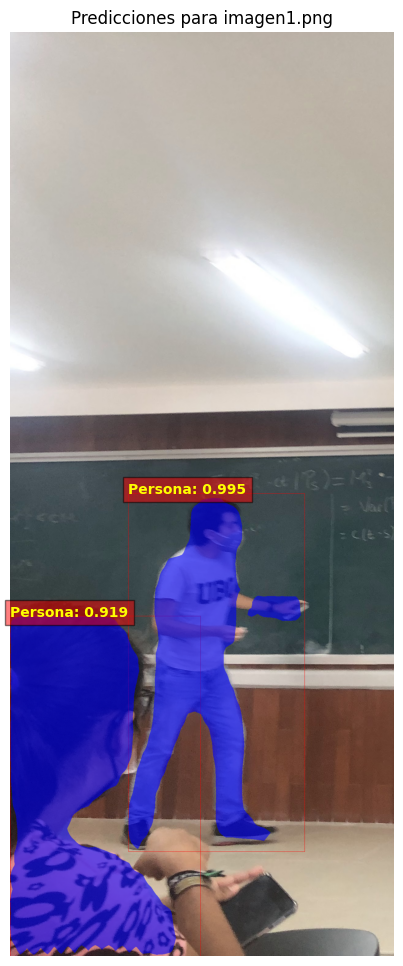

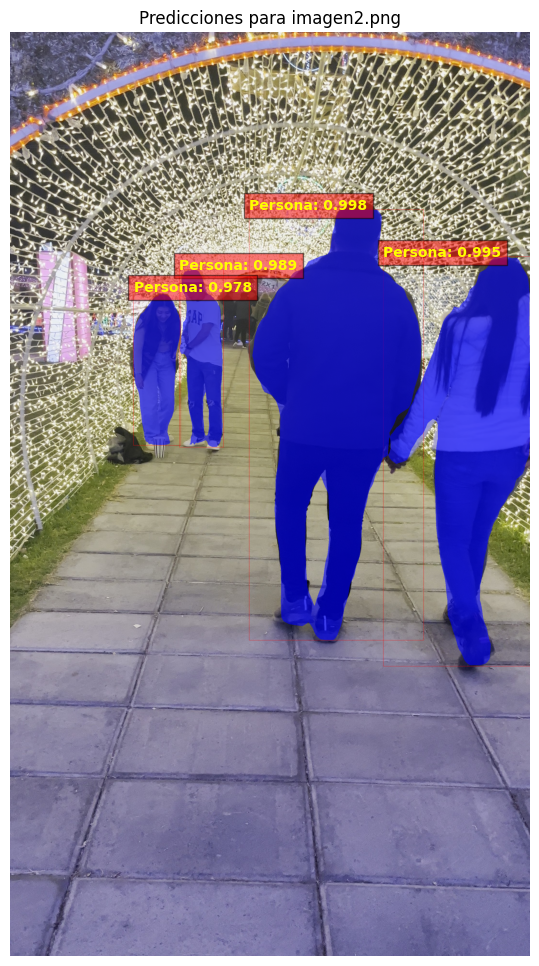

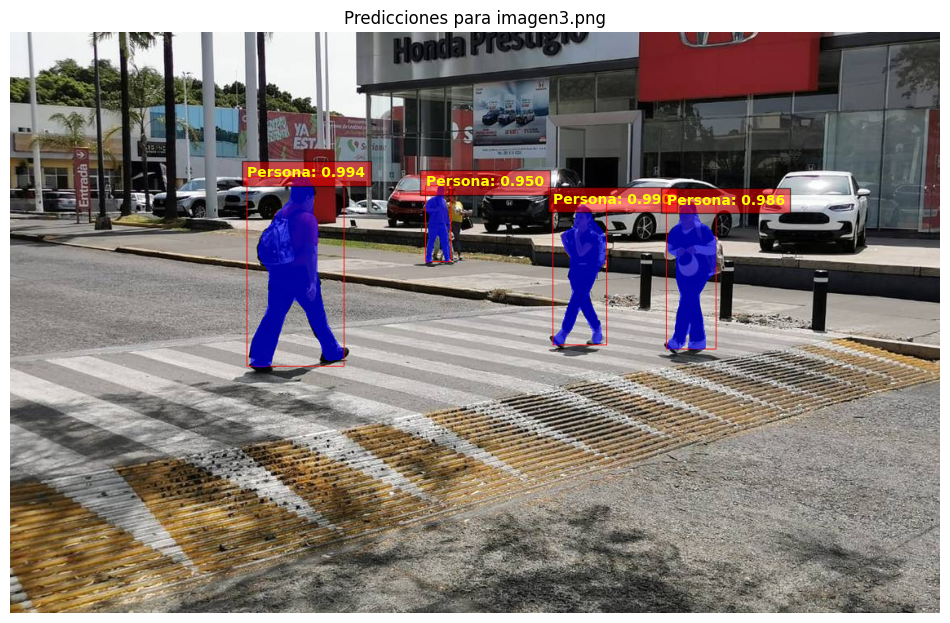

In [28]:
%matplotlib inline
evaluate_image(model=modelo,image_path="imagen1.png",threshold=0.8,device=dispositivo)
evaluate_image(model=modelo,image_path="imagen2.png",threshold=0.8,device=dispositivo)
evaluate_image(model=modelo,image_path="imagen3.png",threshold=0.8,device=dispositivo)

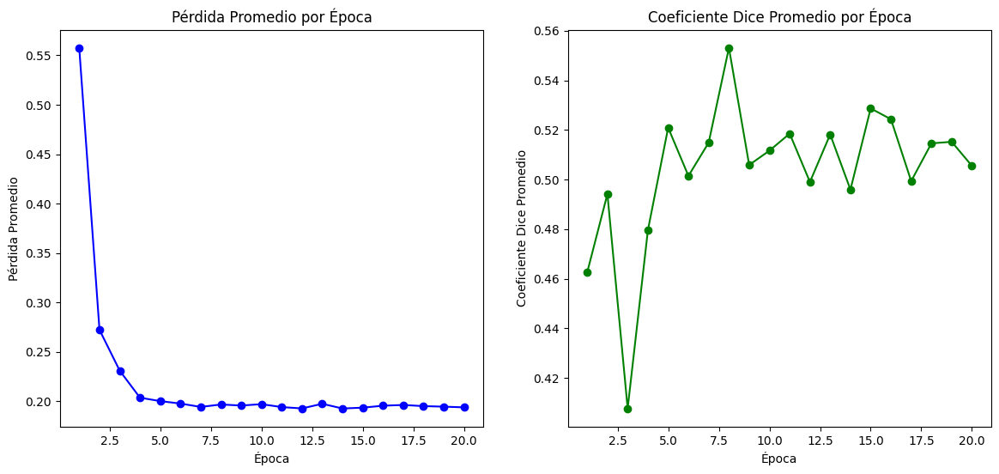

In [24]:
plt.figure(figsize=(14, 6))

# Gráfico de las pérdidas por época
plt.subplot(1, 2, 1)
plt.plot(range(1, n_epocas + 1), losses_per_epoch, marker='o', linestyle='-', color='b')
plt.xlabel('Época')
plt.ylabel('Pérdida Promedio')
plt.title('Pérdida Promedio por Época')

# Gráfico del coeficiente Dice por época
plt.subplot(1, 2, 2)
plt.plot(range(1, n_epocas + 1), dice_per_epoch, marker='o', linestyle='-', color='g')
plt.xlabel('Época')
plt.ylabel('Coeficiente Dice Promedio')
plt.title('Coeficiente Dice Promedio por Época')

# Ajustar el layout para mejor visualización
plt.show()